# Semantic Segmentation: TC3002B Project

## Testing different models

Gabriel Rodríguez de los Reyes (a01027384@tec.mx)

Joaquín Badillo Granillo (a01026364@tec.mx)

## Libs and Data

In [2]:
# Repeatable test
from google.colab import drive
# drive.mount('/content/drive')

!pip install torchvision lightning -q > /dev/null # suppress
!pip install segmentation-models-pytorch -q > /dev/null # suppress
!pip install tqdm -q > /dev/null # suppress

import os
import torch
import torch.nn.functional as F

from torch import optim, nn, utils, Tensor
from torch.utils.data import DataLoader, Dataset, random_split
from torchvision import transforms as T

import lightning as L
from lightning import Trainer, seed_everything
from lightning.pytorch.loggers import TensorBoardLogger
from lightning.pytorch.callbacks import ModelCheckpoint, EarlyStopping

import numpy as np
import matplotlib.pyplot as plt
import random

from tqdm import tqdm
from matplotlib import colors
from torchvision.datasets import MNIST

from segmentation_models_pytorch.losses import DiceLoss, MULTICLASS_MODE

L.seed_everything(2025 + 5 + 28); # Deadline date lol

class DatasetGenerator:
    def __init__(self, canvas_size=(112, 112), num_images=5, output_folder="mnist_compositions", device=None):
        self.input_height, self.input_width = 28, 28
        self.canvas_height, self.canvas_width = canvas_size
        self.num_images = num_images
        self.output_folder = output_folder

        self.device = device if device else torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self.mnist_images, self.mnist_labels = self.load_mnist()

        os.makedirs(output_folder, exist_ok=True)

    def load_mnist(self):
        dataset = MNIST(root=".", train=True, download=True, transform=T.ToTensor())
        images = torch.stack([dataset[i][0] for i in range(len(dataset))]).squeeze(1).to(self.device)
        labels = torch.tensor([dataset[i][1] for i in range(len(dataset))], device=self.device)
        return images, labels

    def is_valid_position(self, y, x, placed_positions):
        for py, px in placed_positions:
            if not (x + self.input_width <= px or px + self.input_width <= x or
                    y + self.input_height <= py or py + self.input_height <= y):
                return False
        return True

    def generate_composition(self):
        canvas = torch.zeros((self.canvas_height, self.canvas_width), dtype=torch.float32, device=self.device)
        label_mask = torch.full((self.canvas_height, self.canvas_width), 0, dtype=torch.uint8, device=self.device)

        placed_positions = []

        for _ in range(self.num_images):
            for attempt in range(1000):
                y = random.randint(0, self.canvas_height - self.input_height)
                x = random.randint(0, self.canvas_width - self.input_width)
                if self.is_valid_position(y, x, placed_positions):
                    idx = random.randint(0, len(self.mnist_images) - 1)
                    img = self.mnist_images[idx]
                    label = self.mnist_labels[idx].item()
                    class_value = 10 if label == 0 else label

                    canvas[y:y+28, x:x+28] = torch.maximum(canvas[y:y+28, x:x+28], img)
                    digit_mask = (img > 0.1).to(torch.int64) * class_value
                    label_mask[y:y+28, x:x+28] = torch.maximum(label_mask[y:y+28, x:x+28], digit_mask)

                    placed_positions.append((y, x))
                    break
        return canvas, label_mask

    def generate_multiple_compositions(self, num_compositions):
        images, labels = [], []
        for _ in tqdm(range(num_compositions), desc="Generating compositions"):
            img, lbl = self.generate_composition()
            images.append(img.cpu().numpy())
            labels.append(lbl.cpu().numpy())
        return images, labels

    def create_training_set(self, num_compositions):
        images, labels = self.generate_multiple_compositions(num_compositions)
        images_folder = os.path.join(self.output_folder, "images")
        labels_folder = os.path.join(self.output_folder, "labels")
        os.makedirs(images_folder, exist_ok=True)
        os.makedirs(labels_folder, exist_ok=True)

        for i, (img, lbl) in enumerate(zip(images, labels)):
            np.save(os.path.join(images_folder, f"image_{i:06d}.npy"), img)
            np.save(os.path.join(labels_folder, f"label_{i:06d}.npy"), lbl)

canvas_size = (112, 112)
num_images = 5
num_compositions = 100
placer = DatasetGenerator(canvas_size=canvas_size,
                          num_images=num_images,
                          output_folder="mnist_compositions",
                          device=torch.device("cuda" if torch.cuda.is_available() else "cpu"))

placer.create_training_set(num_compositions)

class SemanticSegmentationDataset(Dataset):
    def __init__(self, images_dir, masks_dir, img_transform=None, mask_transform=None):
        self.images_dir = images_dir
        self.masks_dir = masks_dir
        self.img_transform = img_transform
        self.mask_transform = img_transform

        self.image_filenames = sorted(os.listdir(images_dir))
        self.mask_filenames = sorted(os.listdir(masks_dir))

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, idx):
      image_path = os.path.join(self.images_dir, self.image_filenames[idx])
      mask_path = os.path.join(self.masks_dir, self.mask_filenames[idx])

      image = np.load(image_path)
      mask = np.load(mask_path).astype(np.int64)

      if self.img_transform:
        image = self.img_transform(image)

      if self.mask_transform:
        mask = self.mask_transform(mask)

      if len(mask.shape) == 3:
        mask = mask.squeeze(0)

      return image, mask

testset = SemanticSegmentationDataset(
    images_dir='mnist_compositions/images',
    masks_dir='mnist_compositions/labels',
    img_transform=T.ToTensor(),
    mask_transform=T.Compose([
        T.ToTensor(),
        T.Lambda(lambda x: x.long())
    ])
)

test_loader = DataLoader(testset, batch_size=16, shuffle=False, num_workers=11)

INFO: Seed set to 2058
INFO:lightning.fabric.utilities.seed:Seed set to 2058
100%|██████████| 9.91M/9.91M [00:01<00:00, 5.11MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 134kB/s]
100%|██████████| 1.65M/1.65M [00:01<00:00, 1.28MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 161kB/s]
Generating compositions: 100%|██████████| 100/100 [00:00<00:00, 433.46it/s]


In [3]:
import cv2
import matplotlib.pyplot as plt

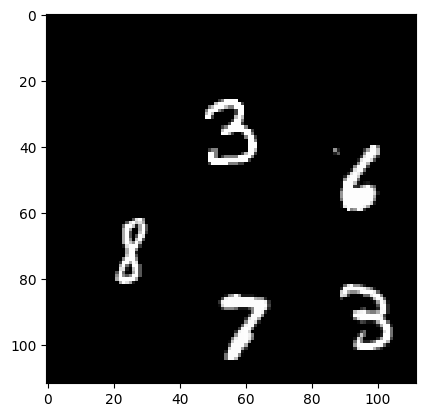

In [28]:
from PIL import Image

loader = DataLoader(testset, batch_size=1, shuffle=False, num_workers=11)
i = 1

for t, _ in test_loader:
  img = (t.cpu().numpy()[0][0] * 255).astype(np.uint8)
  plt.imshow(img, cmap='gray')
  Image.fromarray(img).save(f'samples/output-{i}.jpg')
  i += 1

  if i > 30:
    break

In [29]:
!zip -r /content/samples.zip /content/samples

  adding: content/samples/ (stored 0%)
  adding: content/samples/output-5.jpg (deflated 2%)
  adding: content/samples/output-3.jpg (stored 0%)
  adding: content/samples/output-7.jpg (deflated 1%)
  adding: content/samples/output-1.jpg (stored 0%)
  adding: content/samples/output-6.jpg (deflated 1%)
  adding: content/samples/output-4.jpg (deflated 1%)
  adding: content/samples/output-2.jpg (deflated 0%)


## UNet Model Definition

In [ ]:
import torchvision.models as models

# Resnet34 https://docs.pytorch.org/vision/main/models/generated/torchvision.models.resnet34.html
encoder = "resnet34"
# ImageNet https://docs.pytorch.org/vision/main/generated/torchvision.datasets.ImageNet.html
encoder_weights = "imagenet"

class UNetConvRelu(nn.Sequential):
    def __init__(self, in_channels, out_channels):
        super().__init__(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
        )


class UNetDecoderBlock(nn.Module):
    def __init__(self, in_channels, skip_channels, out_channels):
        super().__init__()
        self.conv1 = UNetConvRelu(in_channels + skip_channels, out_channels)
        self.conv2 = UNetConvRelu(out_channels, out_channels)

    def forward(self, x, skip):
        x = F.interpolate(x, size=skip.shape[2:], mode='bilinear', align_corners=False)
        x = torch.cat([x, skip], dim=1)
        x = self.conv1(x)
        x = self.conv2(x)
        return x


class Unet(nn.Module):
    # match smp interface
    def __init__(self,
                 encoder_name=encoder,
                 encoder_weights=encoder_weights,
                 in_channels=1,
                 classes=11):
        super().__init__()

        base_model = models.resnet34(weights=models.ResNet34_Weights.IMAGENET1K_V1)

        # in channels will be 1 instead of 3 (which resnet uses)
        # adjust dimensions
        if in_channels != 3:
            old_conv = base_model.conv1
            base_model.conv1 = nn.Conv2d(in_channels, 64, kernel_size=7, stride=2, padding=3, bias=False)
            with torch.no_grad():
                if in_channels == 1:
                    base_model.conv1.weight[:] = old_conv.weight.sum(dim=1, keepdim=True)
                else:
                    base_model.conv1.weight[:, :in_channels] = old_conv.weight[:, :in_channels]

        # Encoder
        self.encoder0 = nn.Sequential(base_model.conv1, base_model.bn1, base_model.relu)
        self.encoder1 = nn.Sequential(base_model.maxpool, base_model.layer1)
        self.encoder2 = base_model.layer2
        self.encoder3 = base_model.layer3
        self.encoder4 = base_model.layer4

        # Decoder
        self.decoder4 = UNetDecoderBlock(512, 256, 256)
        self.decoder3 = UNetDecoderBlock(256, 128, 128)
        self.decoder2 = UNetDecoderBlock(128, 64, 64)
        self.decoder1 = UNetDecoderBlock(64, 64, 32)
        self.decoder0 = UNetConvRelu(32, 32)

        # Final segmentation head
        self.segmentation_head = nn.Conv2d(32, classes, kernel_size=1)

    def forward(self, x):
        # Encoder
        e0 = self.encoder0(x)
        e1 = self.encoder1(e0)
        e2 = self.encoder2(e1)
        e3 = self.encoder3(e2)
        e4 = self.encoder4(e3)

        # Decoder
        d4 = self.decoder4(e4, e3)
        d3 = self.decoder3(d4, e2)
        d2 = self.decoder2(d3, e1)
        d1 = self.decoder1(d2, e0)
        d0 = self.decoder0(F.interpolate(d1, scale_factor=2, mode='bilinear', align_corners=False))

        return self.segmentation_head(d0)

### Cross Entropy Loss

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

from matplotlib import colors
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas


class UNetCE(L.LightningModule):
    def __init__(self):
        super().__init__()
        self.unet = Unet(
            encoder_name=encoder,
            encoder_weights=encoder_weights,
            in_channels=1,
            classes=11,
        )
        self.loss_fn = torch.nn.CrossEntropyLoss()

    def forward(self, x):
        return self.unet(x)

    def training_step(self, batch, batch_idx):
        img, mask = batch
        logits = self.forward(img)

        loss = self.loss_fn(logits, mask.long())
        self.log("train/loss", loss, on_step=True, on_epoch=True)
        return loss

    def validation_step(self, batch, batch_idx):
        img, mask = batch
        logits = self(img)

        loss = self.loss_fn(logits, mask.long())
        self.log("val/loss", loss, prog_bar=True, on_epoch=True)

    def inference(self, x, device=None):
        if device is None:
            device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

        self.to(device)
        self.eval()

        with torch.no_grad():
            logits = self.forward(x.to(device))
            pred = torch.nn.functional.softmax(logits[0], dim=0).argmax(dim=0)
            pred = pred.cpu().numpy()

        digit_colors = ['black', 'red', 'orange', 'yellow', 'lime',
                        'lightgreen', 'cyan', 'blue', 'indigo', 'purple',
                        'violet']

        cmap = colors.ListedColormap(digit_colors)
        bounds = np.linspace(-0.5, 10.5, 12)
        norm = colors.BoundaryNorm(bounds, cmap.N)

        fig, ax = plt.subplots(figsize=(4, 4), dpi=100)
        im = ax.imshow(pred, cmap=cmap, norm=norm)
        ax.axis('off')
        cbar = fig.colorbar(im, ax=ax, ticks=np.arange(11),
                            fraction=0.046, pad=0.04)
        cbar.set_ticklabels(
          ['bg'] + [str(i) for i in range(1, 10)] + ['0']
        )

        canvas = FigureCanvas(fig)
        canvas.draw()

        width, height = fig.canvas.get_width_height()
        img = np.frombuffer(canvas.tostring_argb(), dtype='uint8')
        img = img.reshape((height, width, 4))

        plt.close(fig)

        return img


    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=1e-3)
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="min")
        return {
            "optimizer": optimizer,
            "lr_scheduler": {
                "scheduler": scheduler,
                "monitor": "val/loss",
                "interval": "epoch",
                "frequency": 1
            },
        }

### Dice Loss

In [ ]:
class UNetDice(L.LightningModule):
    def __init__(self):
        super().__init__()
        self.unet = Unet(
            encoder_name=encoder,
            encoder_weights=encoder_weights,
            in_channels=1,
            classes=11,
        )
        self.loss_fn = DiceLoss(MULTICLASS_MODE, from_logits=True)

    def forward(self, x):
        return self.unet(x)

    def training_step(self, batch, batch_idx):
        img, mask = batch
        logits = self.forward(img)

        loss = self.loss_fn(logits, mask.long())
        self.log("train/loss", loss, on_step=True, on_epoch=True)
        return loss

    def validation_step(self, batch, batch_idx):
        img, mask = batch
        logits = self(img)

        loss = self.loss_fn(logits, mask.long())
        self.log("val/loss", loss, prog_bar=True, on_epoch=True)

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=1e-3)
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="min")
        return {
            "optimizer": optimizer,
            "lr_scheduler": {
                "scheduler": scheduler,
                "monitor": "val/loss",
                "interval": "epoch",
                "frequency": 1
            },
        }

## SegNet

In [ ]:
class ScratchSegNet(nn.Module):
    def __init__(self, num_classes=11, base_filters=32):
        super().__init__()
        # ---- Encoder ----
        self.enc1 = self._encoder_block(1, base_filters)           # 112→112
        self.enc2 = self._encoder_block(base_filters, base_filters*2)    # 56→56
        self.enc3 = self._encoder_block(base_filters*2, base_filters*4)  # 28→28
        self.enc4 = self._encoder_block(base_filters*4, base_filters*8)  # 14→14

        # Bottleneck
        self.bottleneck = self._encoder_block(base_filters*8, base_filters*16)  # 7→7

        # ---- Decoder ----
        # Channel reduction layers to match pooling indices
        self.reduce4 = nn.Conv2d(base_filters*16, base_filters*8, kernel_size=1)  # 512→256
        self.reduce3 = nn.Conv2d(base_filters*8, base_filters*4, kernel_size=1)   # 256→128
        self.reduce2 = nn.Conv2d(base_filters*4, base_filters*2, kernel_size=1)   # 128→64
        self.reduce1 = nn.Conv2d(base_filters*2, base_filters, kernel_size=1)     # 64→32

        # Decoder blocks (same channels in/out after unpooling)
        self.dec4 = self._decoder_block(base_filters*8, base_filters*8)   # 14→14
        self.dec3 = self._decoder_block(base_filters*4, base_filters*4)   # 28→28
        self.dec2 = self._decoder_block(base_filters*2, base_filters*2)   # 56→56
        self.dec1 = self._decoder_block(base_filters, base_filters)       # 112→112

        # Final classifier
        self.classifier = nn.Conv2d(base_filters, num_classes, kernel_size=1)

    def _encoder_block(self, in_ch, out_ch):
        """Encoder block: Conv-BN-ReLU-Conv-BN-ReLU"""
        return nn.Sequential(
            nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
        )

    def _decoder_block(self, in_ch, out_ch):
        """Decoder block: Conv-BN-ReLU-Conv-BN-ReLU"""
        return nn.Sequential(
            nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
        )

    def forward(self, x):
        # ---- ENCODER PATH ----
        # Encode and store pooling indices
        e1 = self.enc1(x)                                    # [B, 32, 112, 112]
        e1_pooled, indices1 = F.max_pool2d(e1, 2, return_indices=True) # [B, 32, 56, 56]

        e2 = self.enc2(e1_pooled)                           # [B, 64, 56, 56]
        e2_pooled, indices2 = F.max_pool2d(e2, 2, return_indices=True)  # [B, 64, 28, 28]

        e3 = self.enc3(e2_pooled)                           # [B, 128, 28, 28]
        e3_pooled, indices3 = F.max_pool2d(e3, 2, return_indices=True)  # [B, 128, 14, 14]

        e4 = self.enc4(e3_pooled)                           # [B, 256, 14, 14]
        e4_pooled, indices4 = F.max_pool2d(e4, 2, return_indices=True)  # [B, 256, 7, 7]

        # Bottleneck
        b = self.bottleneck(e4_pooled)                      # [B, 512, 7, 7]

        # ---- DECODER PATH ----
        # Reduce channels to match pooling indices, then unpool and decode
        b_reduced = self.reduce4(b)                                      # [B, 256, 7, 7]
        d4 = F.max_unpool2d(b_reduced, indices4, kernel_size=2)         # [B, 256, 14, 14]
        d4 = self.dec4(d4)                                              # [B, 256, 14, 14]

        d4_reduced = self.reduce3(d4)                                    # [B, 128, 14, 14]
        d3 = F.max_unpool2d(d4_reduced, indices3, kernel_size=2)        # [B, 128, 28, 28]
        d3 = self.dec3(d3)                                              # [B, 128, 28, 28]

        d3_reduced = self.reduce2(d3)                                    # [B, 64, 28, 28]
        d2 = F.max_unpool2d(d3_reduced, indices2, kernel_size=2)        # [B, 64, 56, 56]
        d2 = self.dec2(d2)                                              # [B, 64, 56, 56]

        d2_reduced = self.reduce1(d2)                                    # [B, 32, 56, 56]
        d1 = F.max_unpool2d(d2_reduced, indices1, kernel_size=2)        # [B, 32, 112, 112]
        d1 = self.dec1(d1)                                              # [B, 32, 112, 112]

        # Final classification
        output = self.classifier(d1)                        # [B, 11, 112, 112]

        return output

In [ ]:
class SegNet(L.LightningModule):
    def __init__(self, lr: float = 1e-3):
        super().__init__()
        # replace Unet with our custom ScratchSegNet
        self.model   = ScratchSegNet(num_classes=11, base_filters=32)
        self.loss_fn = DiceLoss(MULTICLASS_MODE, from_logits=True)
        #change to DIce
        self.losd_dn = nn
        self.lr      = lr

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # expects x shape (B, 1, 112, 112)
        # returns logits shape (B, 11, 112, 112)
        return self.model(x)

    def training_step(self, batch, batch_idx):
        imgs, masks = batch
        logits = self(imgs)
        # masks shape: (B, 112, 112), values in 0..10
        loss = self.loss_fn(logits, masks)
        self.log("train/loss", loss, on_step=True, on_epoch=True, prog_bar=False)
        return loss

    def validation_step(self, batch, batch_idx):
        imgs, masks = batch
        logits = self(imgs)
        loss = self.loss_fn(logits, masks)
        self.log("val/loss", loss, on_step=False, on_epoch=True, prog_bar=True)
        # (optional) compute per-class IoU or accuracy here
        return loss

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=self.lr)
        scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="min")
        return {
            "optimizer": optimizer,
            "lr_scheduler": {"scheduler": scheduler, "monitor": "val/loss"},
        }

## Cross Attention Model Definition

In [ ]:
class CrossAttention2d(nn.Module):
    def __init__(self, channels, num_heads=4, downsample_kv: bool = False):
        super().__init__()
        self.num_heads = num_heads

        # 1×1 convs to project into Q, K, V
        self.q_proj = nn.Conv2d(channels, channels, kernel_size=1)
        self.k_proj = nn.Conv2d(channels, channels, kernel_size=1)
        self.v_proj = nn.Conv2d(channels, channels, kernel_size=1)

        # Optionally downsample K & V to save memory
        if downsample_kv:
            self.k_down = nn.Conv2d(channels, channels, kernel_size=2, stride=2)
            self.v_down = nn.Conv2d(channels, channels, kernel_size=2, stride=2)
        else:
            self.k_down = self.v_down = None

        # Multi-head attention expects (L, B, C)
        self.attn = nn.MultiheadAttention(channels, num_heads)

        # fuse attended output back to decoder
        self.out_proj = nn.Conv2d(channels, channels, kernel_size=1)

    def forward(self, dec_feat: torch.Tensor, skip_feat: torch.Tensor):
        B, C, H, W = dec_feat.shape

        # Project
        q = self.q_proj(dec_feat)
        k = self.k_proj(skip_feat)
        v = self.v_proj(skip_feat)

        # Optional downsample for memory saving
        if self.k_down is not None:
            k = self.k_down(k)
            v = self.v_down(v)

        def flatten_for_attn(x):
            B, C, h, w = x.shape
            x = x.view(B, C, h*w)
            return x.permute(2, 0, 1)

        q_seq = flatten_for_attn(q)
        k_seq = flatten_for_attn(k)
        v_seq = flatten_for_attn(v)

        attn_out, _ = self.attn(q_seq, k_seq, v_seq)
        attn_out = attn_out.permute(1, 2, 0).view(B, C, H, W)

        out = self.out_proj(attn_out) + dec_feat
        return out


class EncoderBlock(nn.Module):
  def __init__(self, in_channels, out_channels, pool_kernel=2):
    super().__init__()
    self.block = nn.Sequential(
      nn.Conv2d(in_channels, out_channels, 3, padding=1),
      nn.BatchNorm2d(out_channels),
      nn.ReLU(),
      nn.Conv2d(out_channels, out_channels, 3, padding=1),
      nn.BatchNorm2d(out_channels),
      nn.ReLU()
    )
    self.pool = lambda x: F.max_pool2d(x,return_indices=True, kernel_size=pool_kernel)

  def forward(self, x):
    x = self.block(x)
    x_pooled, _ = self.pool(x)
    return x, x_pooled


class DecoderBlock(nn.Module):
    def __init__(self, in_channels, out_channels, attn_channels, num_heads=4, downsample_kv=False):
        super().__init__()
        # upsample
        self.upconv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size=2, stride=2)
        # attention
        self.attn  = CrossAttention2d(attn_channels, num_heads, downsample_kv)
        # convolutional refinement
        self.block = nn.Sequential(
            nn.Conv2d(out_channels, out_channels, 3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(),
            nn.Conv2d(out_channels, out_channels, 3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU()
        )

    def forward(self, x, skip):
        x = self.upconv(x)
        x = self.attn(x, skip)
        x = self.block(x)
        return x

class Autoencoder(nn.Module):
  def __init__(self, num_classes=11, in_channels=1):
    super().__init__()

    # Encoding
    self.enc1 = EncoderBlock(in_channels, 16)
    self.enc2 = EncoderBlock(16, 32)
    self.enc3 = EncoderBlock(32, 64)

    self.bottleneck = nn.Sequential(
      nn.Conv2d(64, 128, 3, padding=1),
      nn.ReLU(),
      nn.Conv2d(128, 128, 3, padding=1),
      nn.ReLU()
    )

    # Decoding
    self.dec3 = DecoderBlock(in_channels=128,
                             out_channels=64,
                             attn_channels=64,
                             num_heads=2)
    self.dec2 = DecoderBlock(in_channels=64,
                             out_channels=32,
                             attn_channels=32,
                             num_heads=2,
                             downsample_kv=True)
    self.dec1 = DecoderBlock(in_channels=32,
                             out_channels=16,
                             attn_channels=16,
                             num_heads=2,
                             downsample_kv=True)

    # Classify
    self.final_conv = nn.Conv2d(16, num_classes, kernel_size=1)

  def forward(self, x):
    s1, x = self.enc1(x)
    #out: [B, 16, 56, 56] (pooled), [B, 16, 112, 112] (unpooled)

    s2, x = self.enc2(x)
    #out: [B, 32, 28, 28] (pooled), [B, 32, 112, 112] (unpooled)

    s3, x = self.enc3(x)
    #out: [B, 64, 14, 14] (pooled), [B, 64, 28, 28] (unpooled)

    x = self.bottleneck(x)
    # out [B, 128, 14, 14]

    x = self.dec3(x, s3)
    x = self.dec2(x, s2)
    x = self.dec1(x, s1)

    logits = self.final_conv(x)
    return logits

In [ ]:
class Attn(L.LightningModule):
    def __init__(self):
      super().__init__()
      self.model = Autoencoder(in_channels=1)
      self.loss_fn = torch.nn.CrossEntropyLoss()

    def forward(self, x):
      return self.model(x)

    def training_step(self, batch, batch_idx):
      img, mask = batch
      logits = self.forward(img)

      loss = self.loss_fn(logits, mask.long())
      self.log("train/loss", loss, on_step=True, on_epoch=True)
      return loss

    def validation_step(self, batch, batch_idx):
      img, mask = batch
      logits = self(img)

      loss = self.loss_fn(logits, mask.long())
      self.log("val/loss", loss, prog_bar=True, on_epoch=True)

    def configure_optimizers(self):
      optimizer = torch.optim.Adam(self.parameters(), lr=1e-3)
      scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="min")
      return {
        "optimizer": optimizer,
        "lr_scheduler": {
          "scheduler": scheduler,
          "monitor": "val/loss",
          "interval": "epoch",
          "frequency": 1
        },
      }

# Test

## Runner

In [ ]:
from matplotlib import colors

ckpt_dir = "/content/drive/MyDrive/TC3002B/checkpoints"

def run_test(model):
  # Run on GPU
  model.to("cuda")

  digit_colors = [
      'black',
      'red',
      'orange',
      'yellow',
      'lime',
      'lightgreen',
      'cyan',
      'blue',
      'indigo',
      'purple',
      'violet',
  ]

  cmap = colors.ListedColormap(digit_colors)
  bounds = np.linspace(-0.5, 10.5, 12)
  norm = colors.BoundaryNorm(bounds, cmap.N)

  counter = 1
  for img, mask in test_loader:
    logits = model.forward(img.to("cuda"))
    for i in range(len(mask)):
      pred = nn.Softmax(dim=0)(logits[i]).argmax(dim=0)
      pred = pred.cpu()
      fig, axs = plt.subplots(1, 2, figsize=(10, 5))
      axs[0].imshow(mask[i].squeeze() / 10.0, cmap)
      im = axs[0].imshow(mask[i].numpy(), cmap=cmap, norm=norm)
      axs[0].set_title(f"Mask #{counter}")

      cbar = fig.colorbar(im, ax=axs[0], ticks=np.arange(11), fraction=0.046, pad=0.04)
      cbar.set_ticklabels(
          ['bg'] + [str(i) for i in range(1, 10)] + ['0']
      )

      axs[1].imshow(pred / 10.0)
      im = axs[1].imshow(pred.numpy(), cmap=cmap, norm=norm)
      axs[1].set_title("Predicted Segmentation")

      cbar = fig.colorbar(im, ax=axs[1], ticks=np.arange(11), fraction=0.046, pad=0.04)
      cbar.set_ticklabels(
        ['bg'] + [str(i) for i in range(1, 10)] + ['0']
      )
      counter += 1
  plt.show()

## UNet CE

<ipython-input-14-858551560672>:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, 2, figsize=(10, 5))


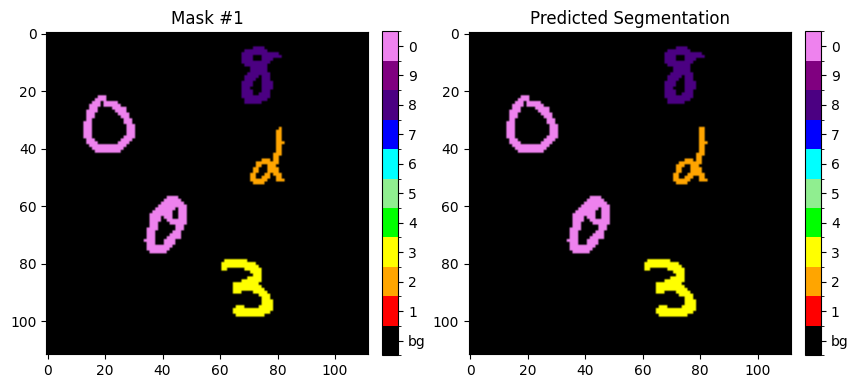

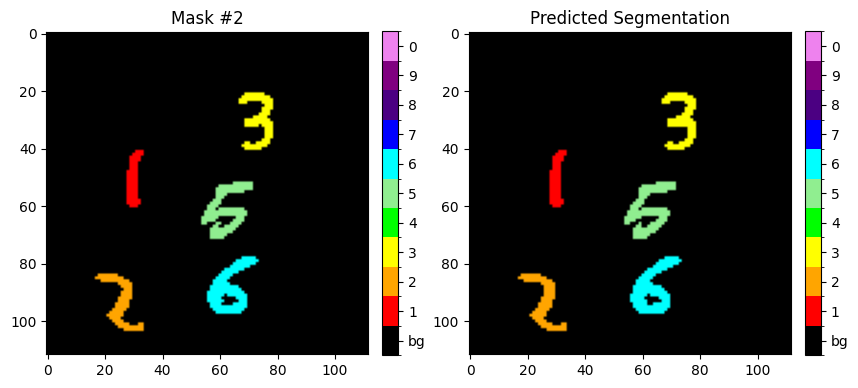

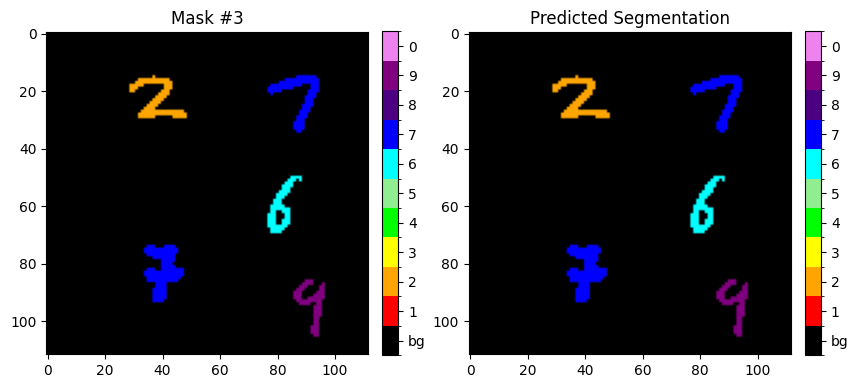

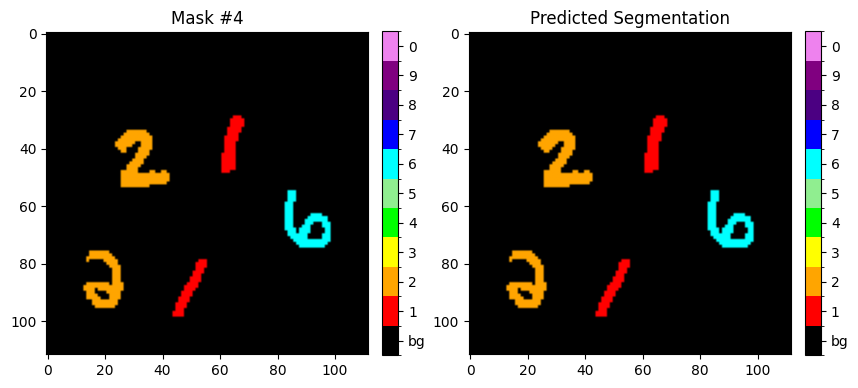

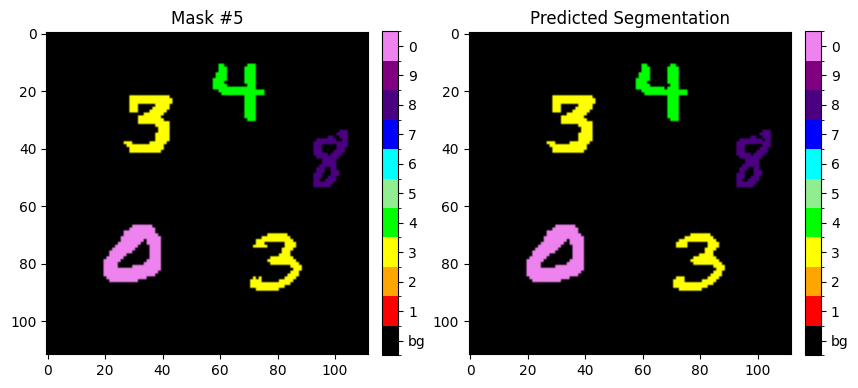

...

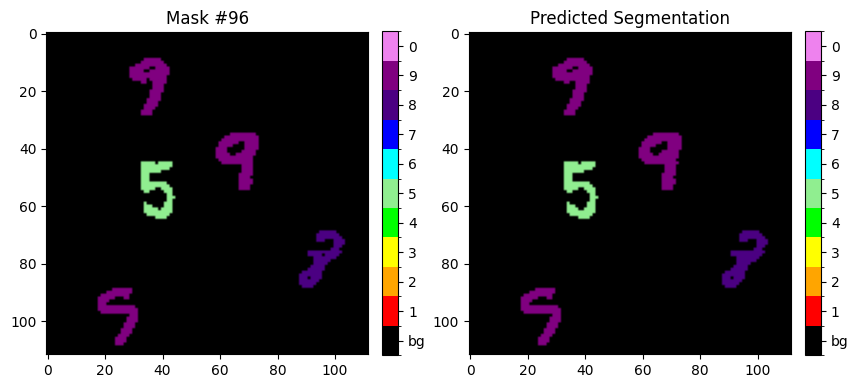

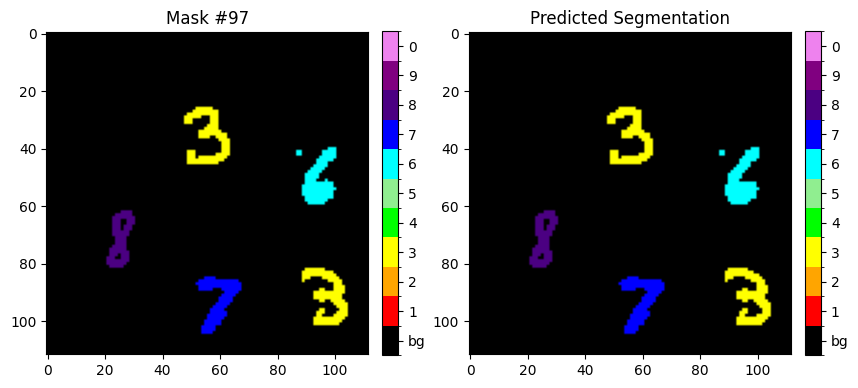

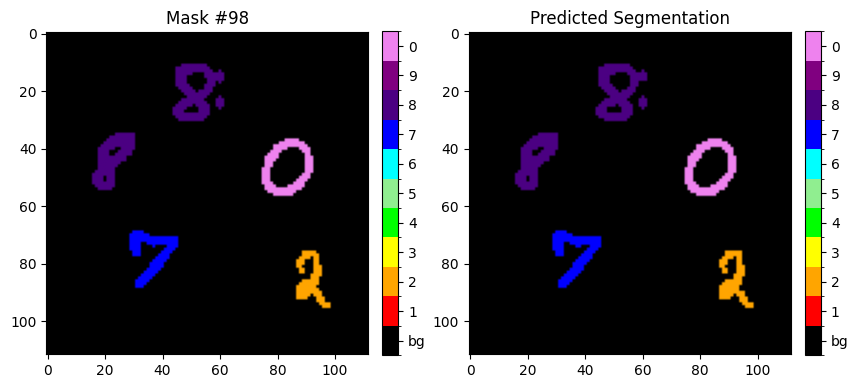

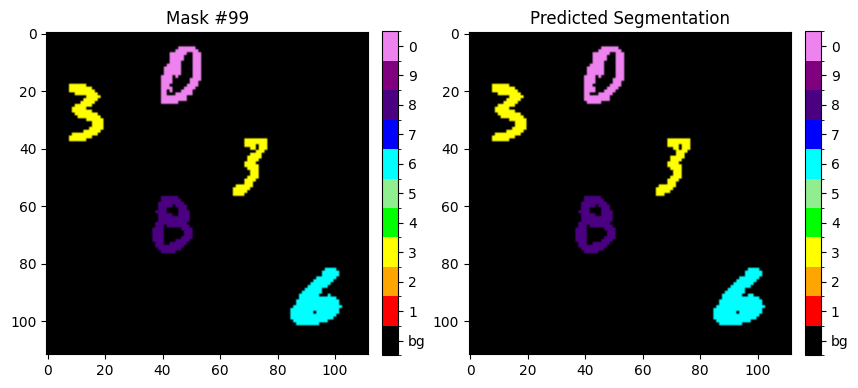

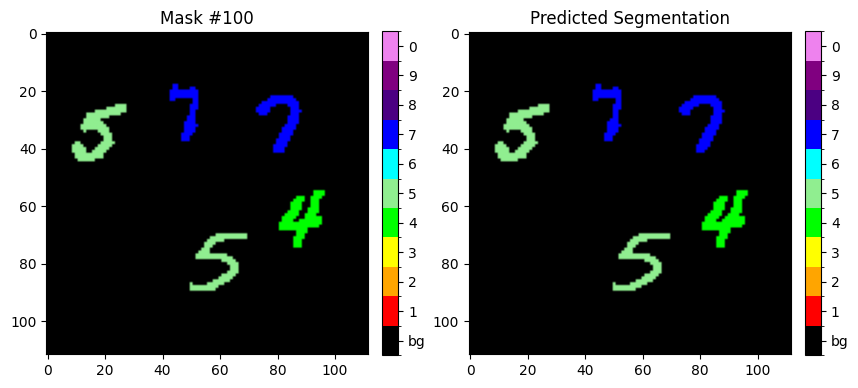

In [ ]:
# Load model
ckpt_file = "UNetCrossEntropy/semantic-segmentation-unet-cross-entropy-epoch=21.ckpt"
model = UNetCE.load_from_checkpoint(f"{ckpt_dir}/{ckpt_file}")

run_test(model)

## UNet Dice

<ipython-input-14-858551560672>:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, 2, figsize=(10, 5))


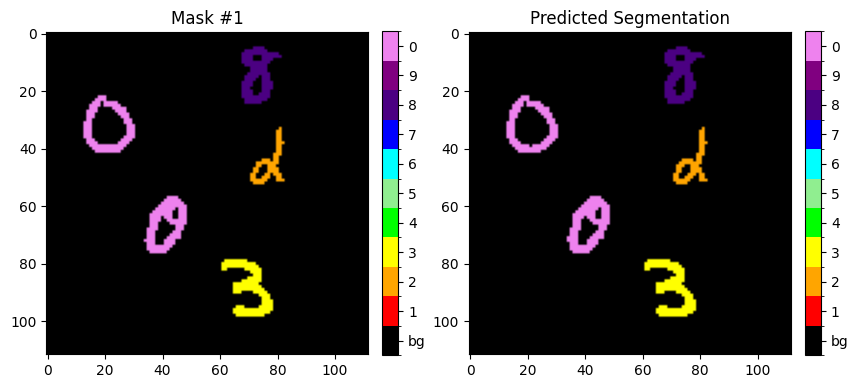

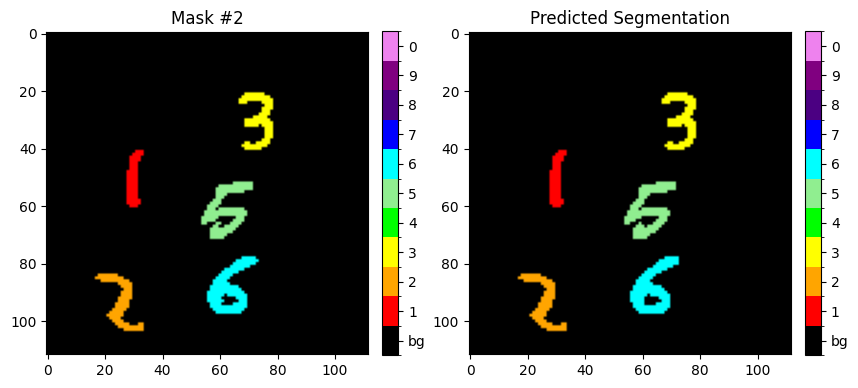

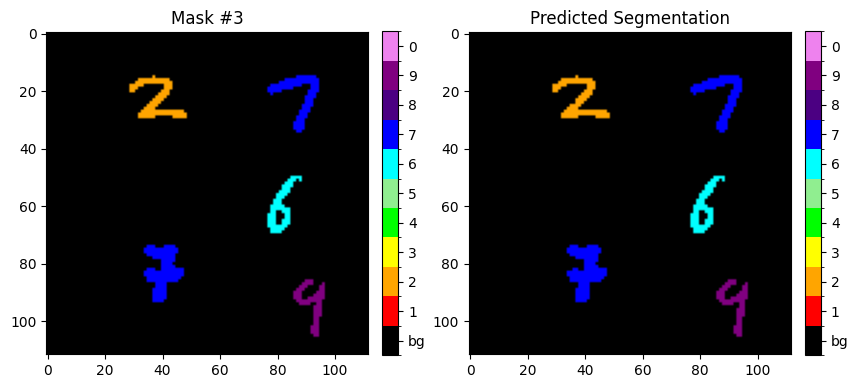

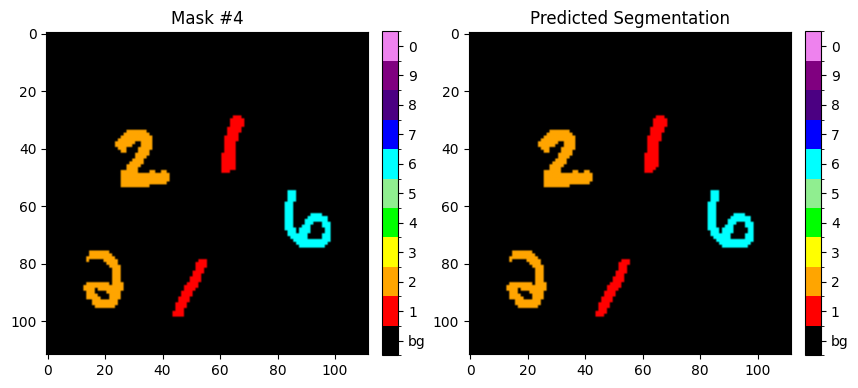

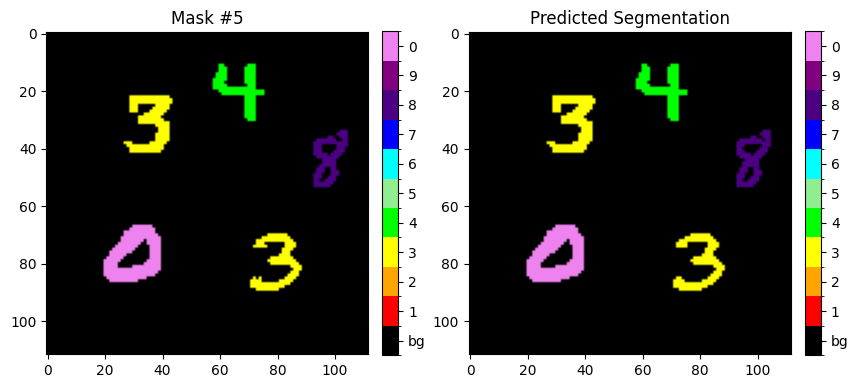

...

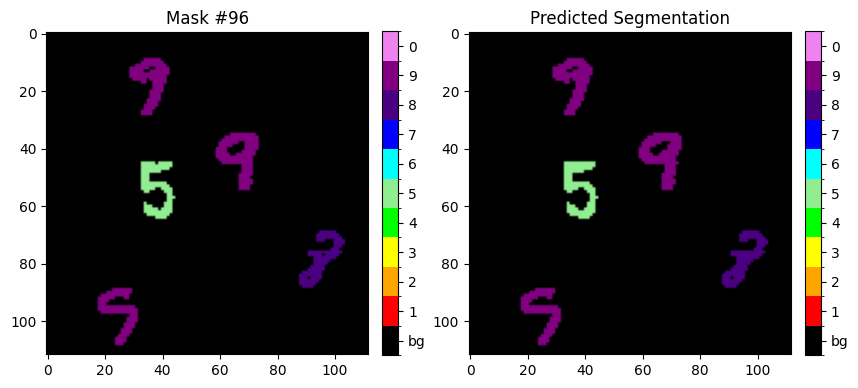

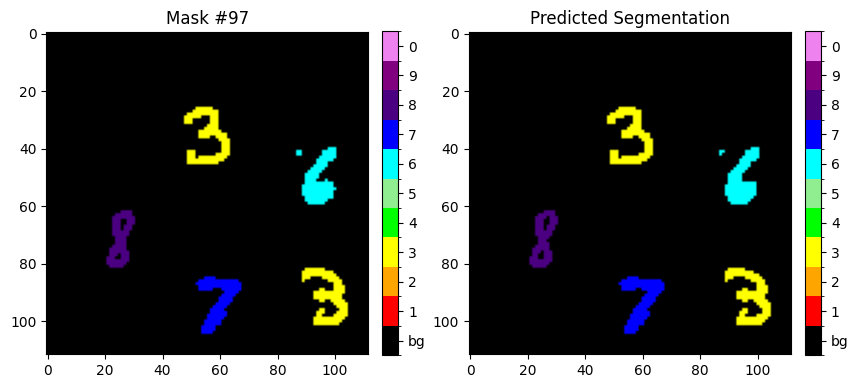

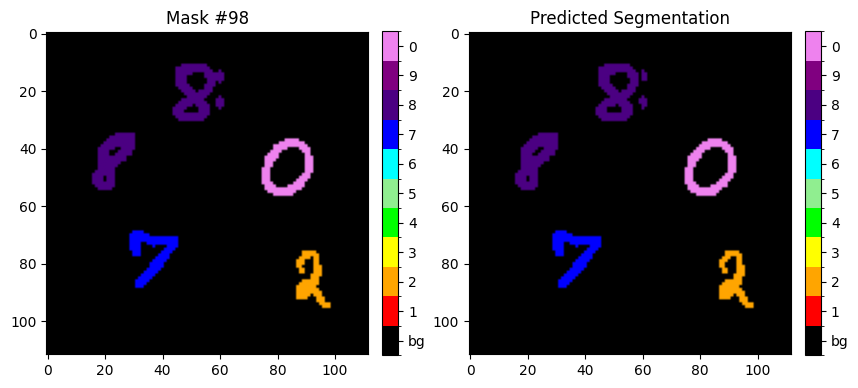

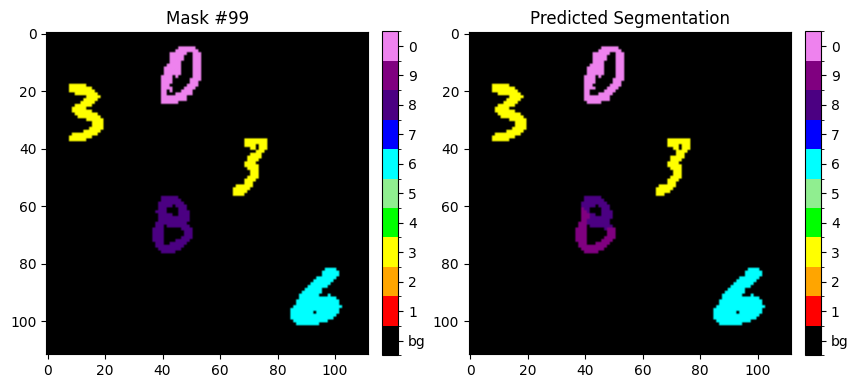

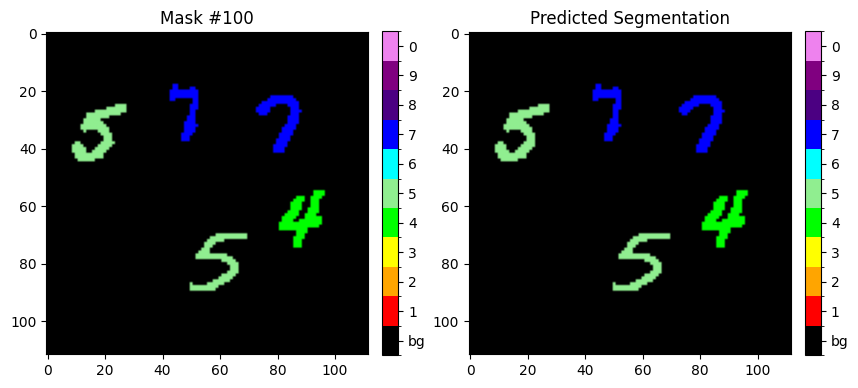

In [ ]:
# Load model
ckpt_file = "UNetDiceCoefficient/semantic-segmentation-unet-dice-epoch=28.ckpt"
model = UNetDice.load_from_checkpoint(f"{ckpt_dir}/{ckpt_file}")

run_test(model)

## SegNet

<ipython-input-14-858551560672>:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, 2, figsize=(10, 5))


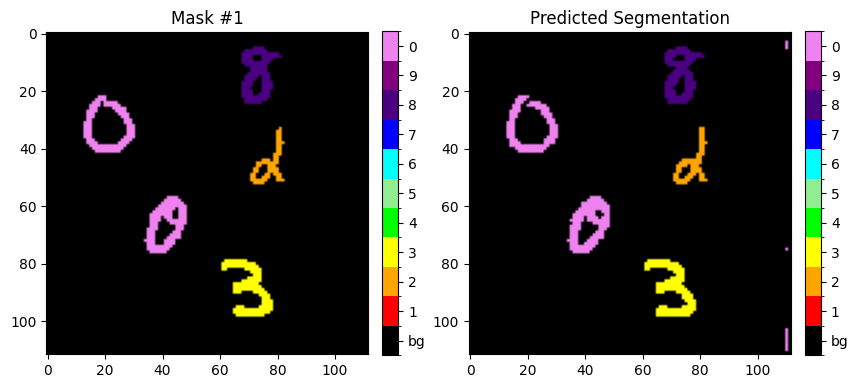

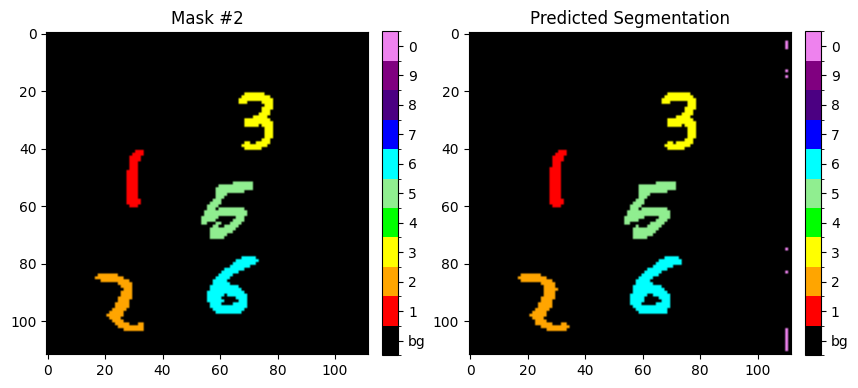

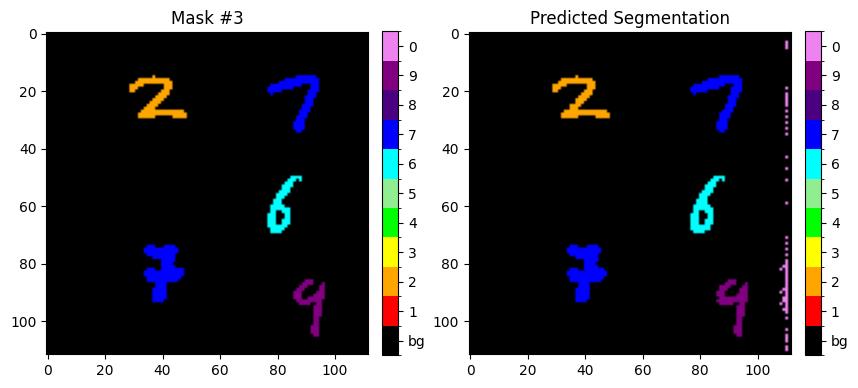

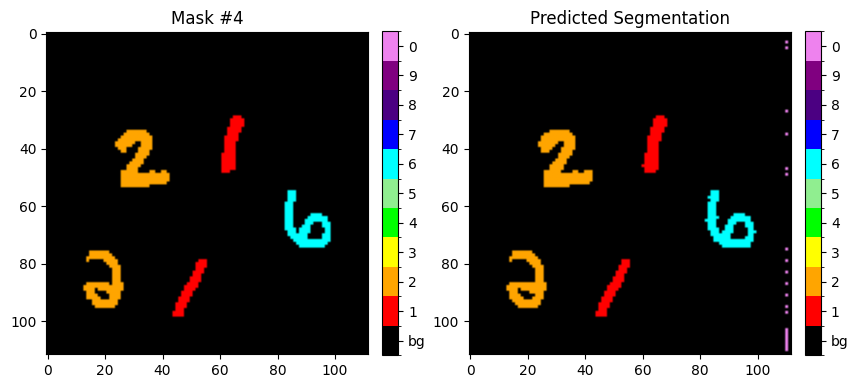

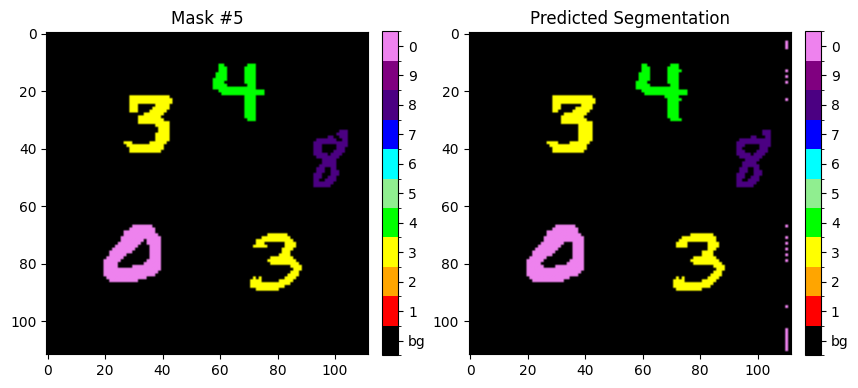

...

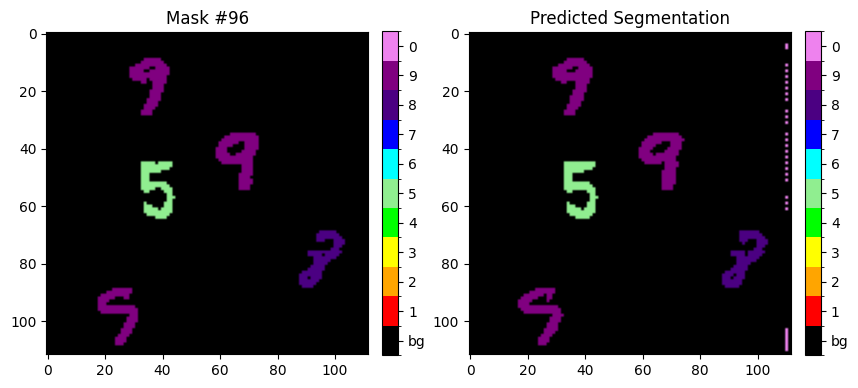

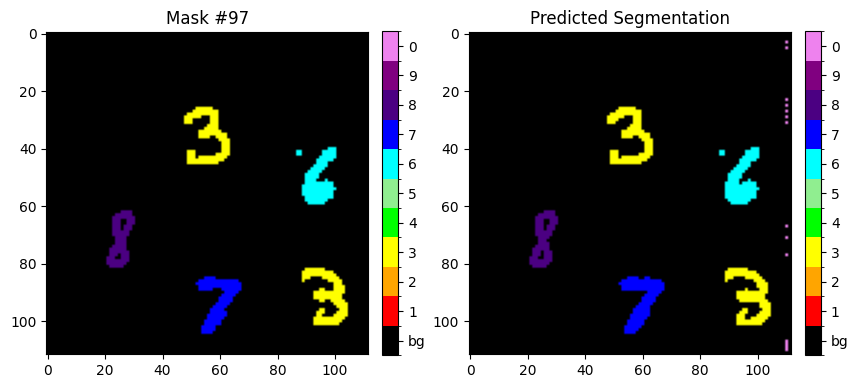

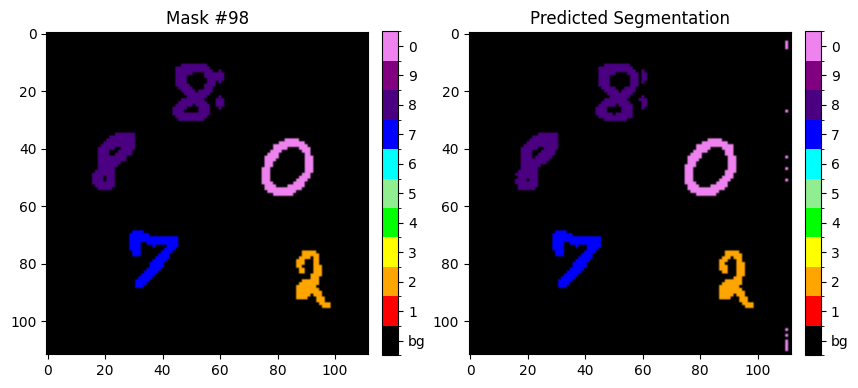

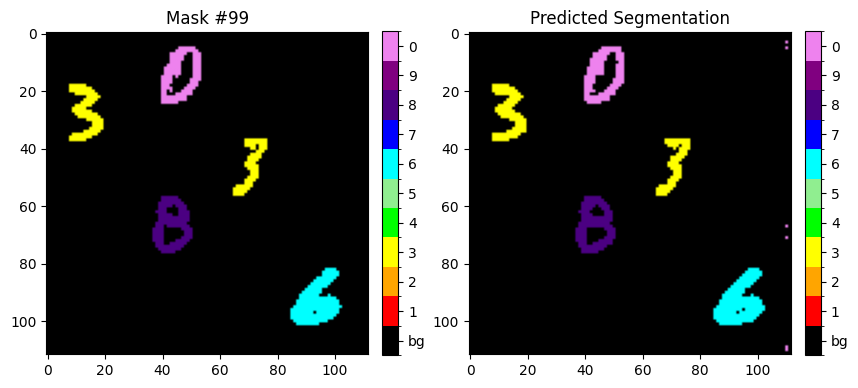

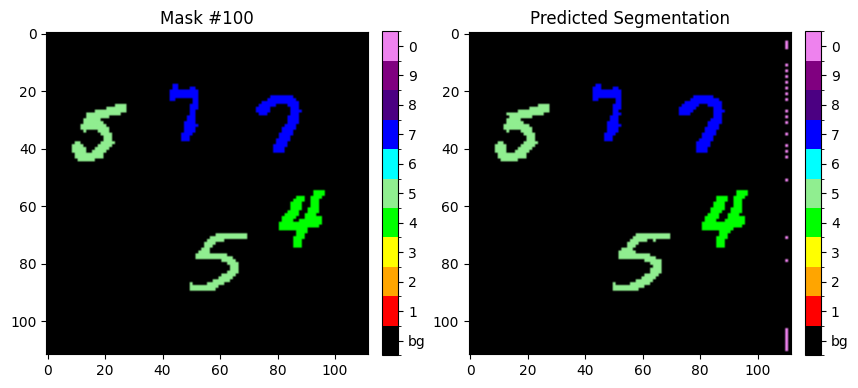

In [ ]:
# Load model
ckpt_file = "SegNet/segnet-epoch=26.ckpt"
model = SegNet.load_from_checkpoint(f"{ckpt_dir}/{ckpt_file}")

run_test(model)

## Attention Autoencoder

<ipython-input-14-858551560672>:33: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(1, 2, figsize=(10, 5))


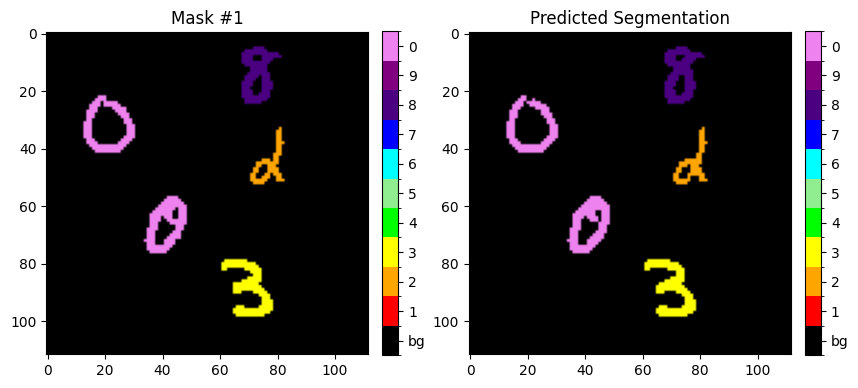

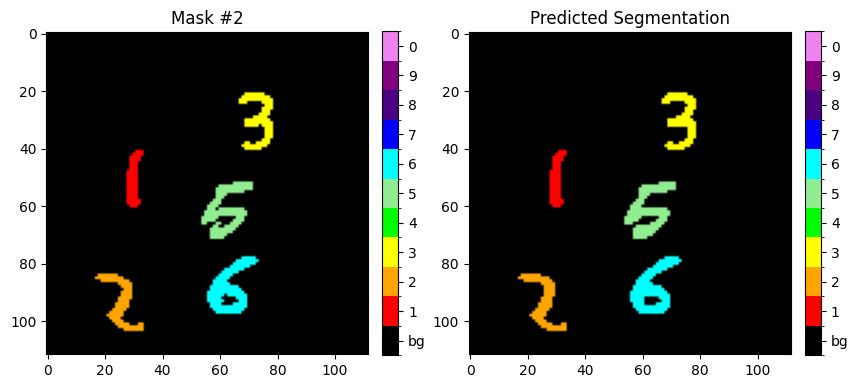

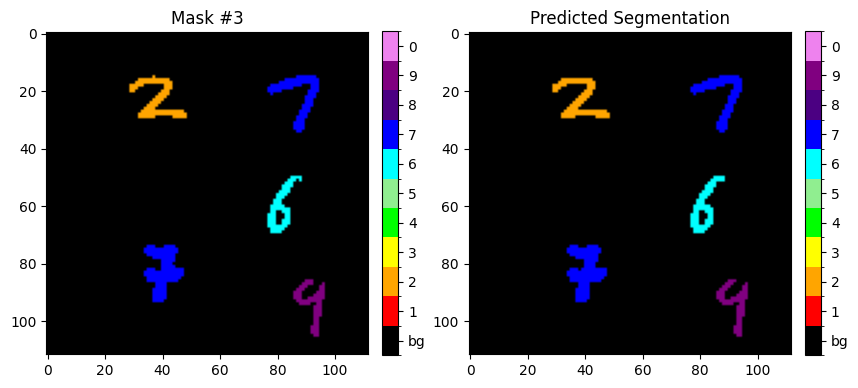

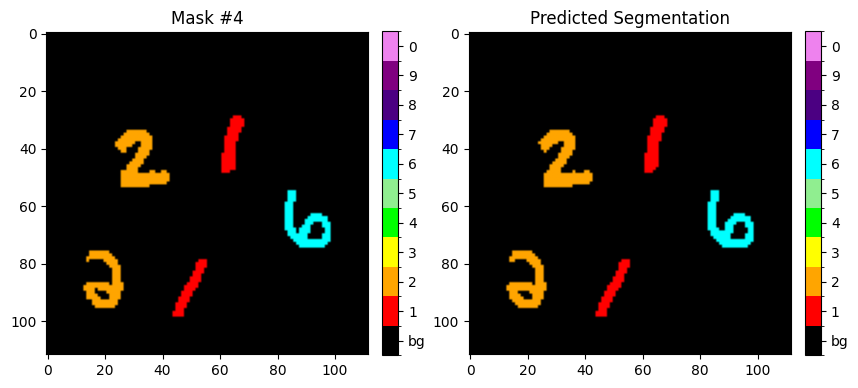

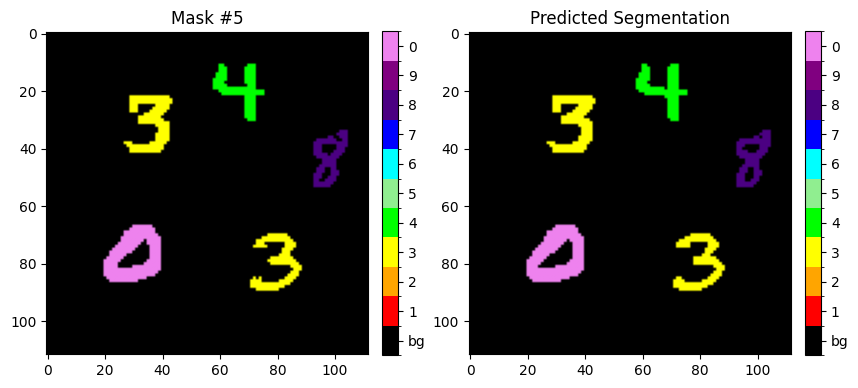

...

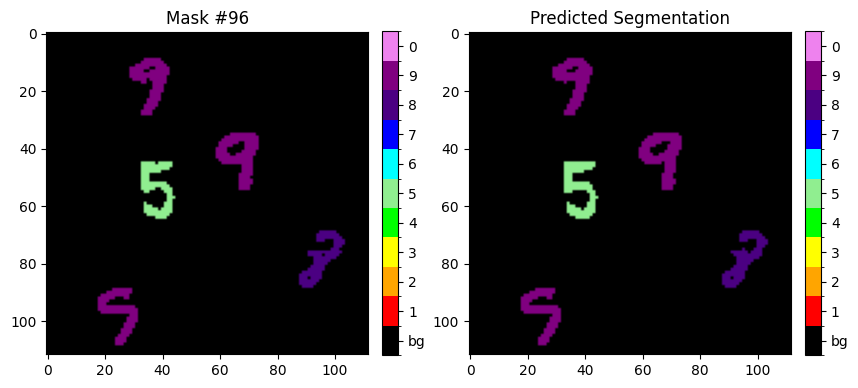

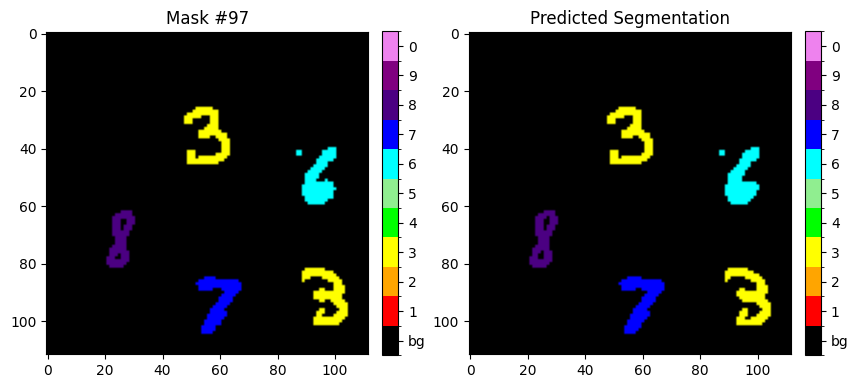

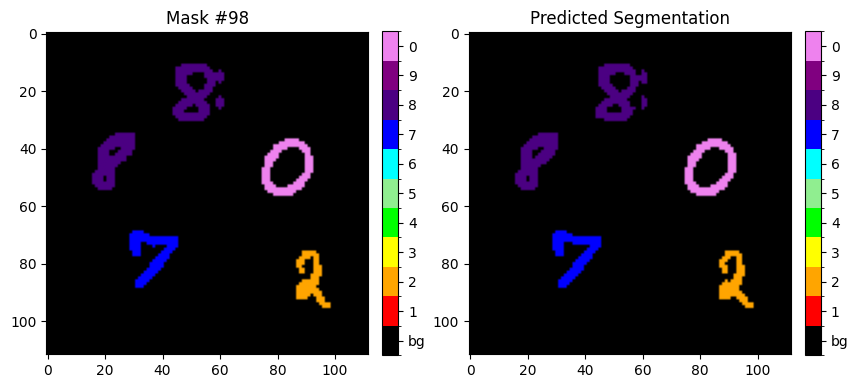

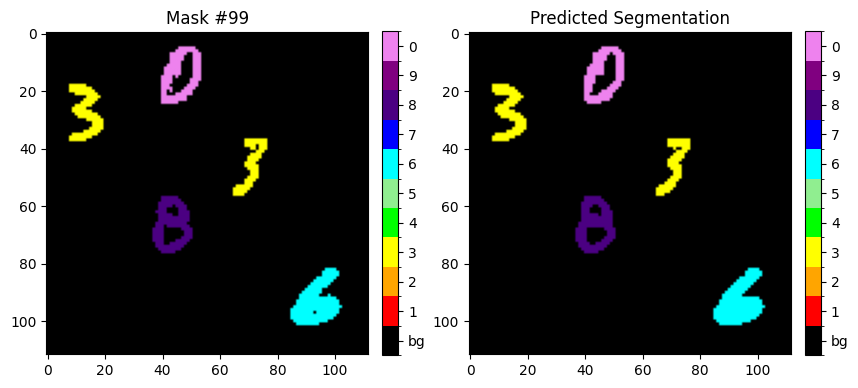

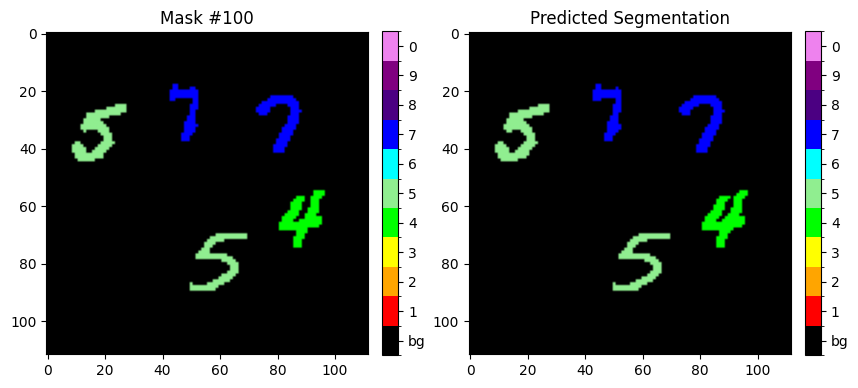

In [ ]:
# Load model
ckpt_file = "AttentionAutoEncoder/semantic-segmentation-attention-epoch=26.ckpt"
model = Attn.load_from_checkpoint(f"{ckpt_dir}/{ckpt_file}")

run_test(model)

In [ ]:
# Load model
ckpt_dir = "/content/drive/MyDrive/TC3002B/checkpoints"
ckpt_file = "semantic-segmentation-unet-cross-entropy-epoch=21.ckpt"
model = UNetCE.load_from_checkpoint(f"{ckpt_dir}/{ckpt_file}")

pred = None

for img, mask in test_loader:
  pred = model.inference(img)
  break

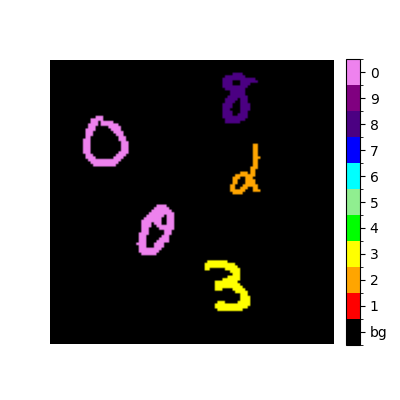

In [ ]:
import PIL

PIL.Image.fromarray(pred[:, :, 1:4])